# Photometry for r/g-band Exposures
### Alex's rework of Locke's code for A100

In [38]:
import numpy as np
import matplotlib.pyplot as plt
import glob
import os
from astropy.io import fits
from astropy.stats import sigma_clipped_stats

from astroquery.gaia import Gaia
from astropy.coordinates import SkyCoord

from astropy.convolution import convolve, Box1DKernel, Box2DKernel

from photutils import DAOStarFinder
from astropy.stats import mad_std

from astropy import wcs
from astropy.wcs import WCS
from astropy.table import Table

from photutils import aperture_photometry, CircularAperture

from astropy.table import QTable
from astropy import units as u
from astropy import constants as const
from astropy.units import imperial
from astropy.coordinates import SkyCoord

In [39]:
workingdir = '/Users/alex/Desktop/A100Observations'
os.chdir(workingdir)

In [40]:
files_all = glob.glob('*fits') #Find all the files that match this pattern
files_BIAS = glob.glob('*BIAS*')
files_FLATS = glob.glob('*FLAT*')
files_ARCS = glob.glob('*COMP*')
files_TEST = glob.glob('*test*')

### Defining readFits function

In [41]:
#creating a function to create a new array "StitchedData" from four images (smaller arrays)
def readFits(filename):
    HDUList = fits.open(filename)
    headers = [HDUList[0].header, HDUList[1].header, HDUList[2].header, HDUList[3].header, HDUList[4].header]

    #dimensions of the images
    nx, ny = 1024, 1024
    
    #creating an array with twice the height and width as the images
    StitchedData = np.zeros((2*nx, 2*ny))
    
    #assigning an image to each quadrant
    StitchedData[nx:nx*2,ny:ny*2] = HDUList[1].data[:-1,8:-8]
    StitchedData[nx:nx*2,0:ny] = HDUList[2].data[:-1,8:-8]
    StitchedData[0:nx,0:ny] = HDUList[4].data[:-1,8:-8]
    StitchedData[0:nx,ny:ny*2] = HDUList[3].data[:-1,8:-8]

    return HDUList, headers, StitchedData

### Filling BiasData with stitched data using readFits on all the BIAS Files

In [42]:
#placeholder variables, getting the new dimension (nx, ny) 
HDUListTest, headersTest, StitchedDataTest = readFits(files_BIAS[0])
nx, ny = StitchedDataTest.shape

#creating the empty array that will hold the bias data
nBias = len(files_BIAS)
BiasData = np.zeros((nx, ny, nBias))

#filling the BiasData array using readFits on each of the BIAS files
for i,file in enumerate(files_BIAS):
    HDUList, headers, StitchedData = readFits(file)
    BiasData[:,:,i] = StitchedData

### Defining highlowreject

In [43]:
#High low rejection 
#better than just a mean or median becauase it accounts for cosmic rays
def highlowreject(BiasData):
    nimage = BiasData.shape[2]
    bias_max = np.max(BiasData, axis=2)
    bias_min = np.min(BiasData, axis=2)
    masterBias = (np.sum(BiasData, axis=2) - bias_min - bias_max)/(nimage-2)
    return masterBias

masterBias = highlowreject(BiasData)

### Creating rBand Flat

In [44]:
#current working model
files_FLATSr = glob.glob('*FLATr*')

nx, ny = 2048, 2048

rFlatsData = np.zeros((nx, ny, len(files_FLATSr)))

for i,file in enumerate(files_FLATSr):
    HDUList, headers, StitchedData = readFits(file)
    StitchedData = StitchedData - masterBias
    x, y = 1024, 1024
    StitchedData[x:x*2,y:y*2] = StitchedData[x:x*2,y:y*2]/np.mean(StitchedData[x:x*2,y:y*2])
    StitchedData[x:x*2,0:y] = StitchedData[x:x*2,0:y]/np.mean(StitchedData[x:x*2,0:y])
    StitchedData[0:x,0:y] =  StitchedData[0:x,0:y]/np.mean(StitchedData[0:x,0:y])
    StitchedData[0:x,y:y*2] = StitchedData[0:x,y:y*2]/np.mean(StitchedData[0:x,y:y*2])
    rFlatsData[:,:,i] = StitchedData 
    
rFlat = highlowreject(rFlatsData)    


# FULL IMAGE REDUCTION

In [45]:
fileName = "/Users/alex/Desktop/A100Observations/0448.M67.fits"
foo, header, sD3 = readFits(fileName)

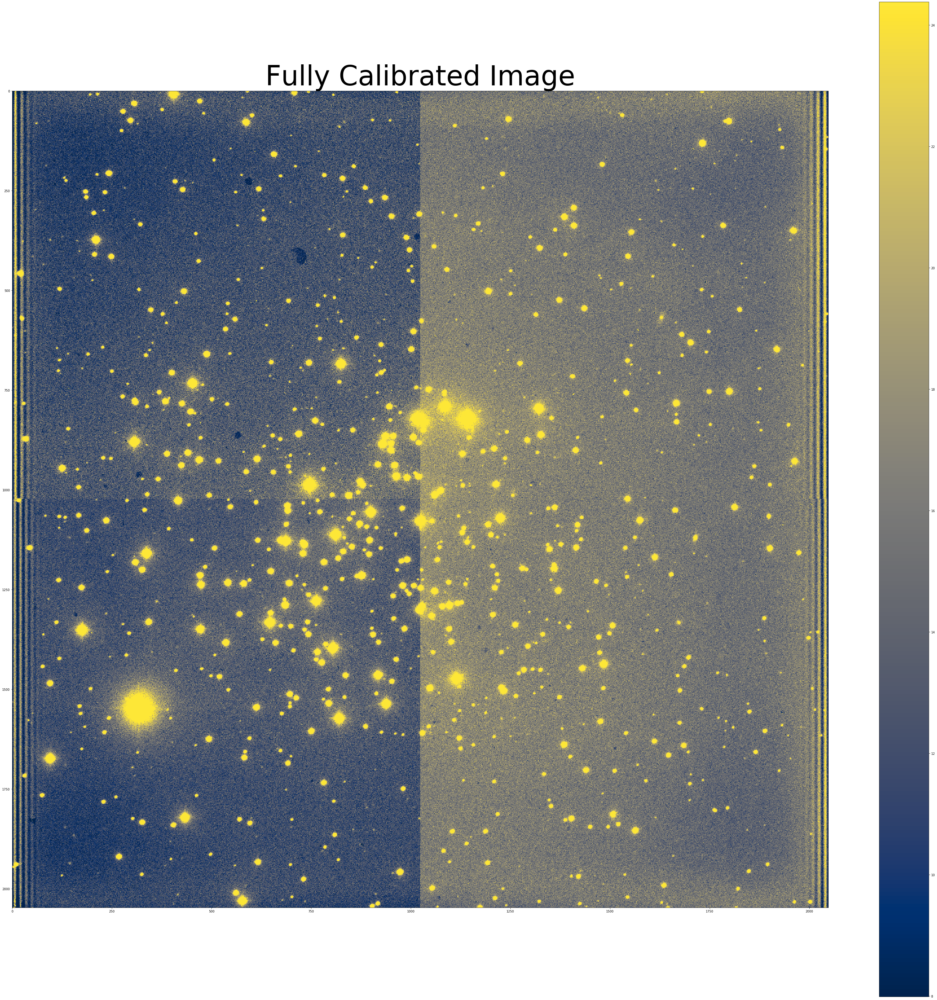

In [46]:
calibratedImage = ((sD3 - masterBias) / rFlat)

mean, median, std = sigma_clipped_stats(calibratedImage)
    
#plotting
plt.figure(figsize=(60,60))                     
plt.imshow(calibratedImage, vmin = median - 2*std, vmax = median + 3*std, cmap='cividis')
plt.colorbar()
plt.title("Fully Calibrated Image", fontsize=90)
plt.show()

# PHOTOMETRY

# _______________________________________________________

## GAIA

In [58]:
# f  = fits.open(fileName)
# GAIAheader = f[0].header
# GAIAheader

In [59]:
# coord = SkyCoord(ra = 132.8250, dec=11.8, unit=(u.degree, u.degree), frame='icrs')
# table = Gaia.query_object_async(coordinate=coord, radius = 25* u.arcmin)

#table


In [60]:
# w = wcs.WCS(GAIAheader)
# w

In [61]:
# worldcoord = np.array([table['ra'], table['dec']]).T

# print(worldcoord)

### Astrometry.net solution needed to get wcs

In [62]:
# pixelcoord = w.wcs_world2pix(worldcoord, 1)

# print(pixelcoord)

In [63]:
#plotting
# plt.figure(figsize=(10,10))                     
# plt.imshow(calibratedImage, vmin = median - 2*std, vmax = median + 3*std, cmap='cividis')
# plt.scatter(pixelcoord[:,0],pixelcoord[:,1],s = 400, marker = 'o',facecolors='none', edgecolors = 'r')
# plt.colorbar()
# plt.title("GAIA Overlay", fontsize=30)
# plt.show()